In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision as tv
from PIL import Image
from pytorch_lightning import Trainer
from torch.nn import functional as F
from torchvision.utils import make_grid

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
from dhdrnet.model import (
    DHDRMobileNet_v1,
    DHDRMobileNet_v2,
    DHDRMobileNet_v3,
    DHDRSimple,
    DHDRSqueezeNet,
)
from dhdrnet.util import DATA_DIR, ROOT_DIR

figdir = ROOT_DIR / "figures"
plt.rcParams["figure.figsize"] = (10, 10)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu") 
gpus = "0" if torch.cuda.is_available() else None

def show(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), interpolation="nearest")
    plt.show()

In [9]:
from IPython.utils import io
def get_best_model(model_cls, backbone:str):
    
    with io.capture_output(stdout=True,stderr=True) as _captured:
        trainer = Trainer(gpus=gpus, progress_bar_refresh_rate=0)
        test_scores = dict()
        for ckpt in (ROOT_DIR / "checkpoints").glob(f"*{backbone}*"):
            model = model_cls.load_from_checkpoint(
                checkpoint_path=str(ckpt)
            )
            model.eval()

            test_score = trainer.test(model)["test_loss"]
            test_scores[str(ckpt.stem)] = test_score
    
    best_model = min(test_scores.items(),key=lambda x:x[1])
    return best_model, test_scores

In [13]:
best_mobilev1, mobile_v1_scores = get_best_model(DHDRMobileNet_v1, "mobile_v1")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [6]:
best_mobilev2, mobile_v2_scores = get_best_model(DHDRMobileNet_v2, "mobile_v2")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [7]:
best_mobilev3, mobile_v3_scores = get_best_model(DHDRMobileNet_v3, "mobile_v3")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [8]:
best_squeeze, squeeze_scores = get_best_model(DHDRSqueezeNet, "squeeze")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [28]:
print(best_mobilev1)
print(best_mobilev2)
print(best_mobilev3)
print(best_squeeze)
best_model = DHDRMobileNet_v2.load_from_checkpoint(
    str(ROOT_DIR / "checkpoints" / f"{best_mobilev2[0]}.ckpt")
).to(device)

('dhdr_mobile_v1_final2020-07-25T16:29:20.164353', nan)
('mobile_v2dhdr-epoch=34-val_loss=1.27', 1.2317886352539062)
('mobile_v3dhdr-epoch=15-val_loss=1.50', 1.5186741352081299)
('squeezedhdr-epoch=59-val_loss=1.60', 1.668781042098999)


In [29]:
image_names = pd.read_csv(ROOT_DIR / "test.txt", header=None).sample(n=9)[0]

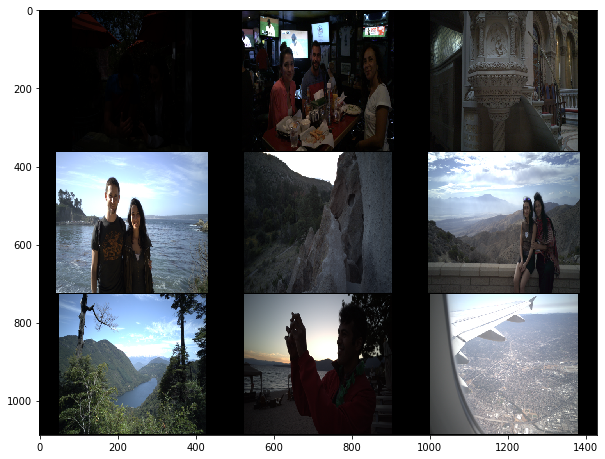

In [30]:
input_images = [
    Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")
    for name in image_names
]

transforms = tv.transforms.Compose(
    [
        tv.transforms.CenterCrop((360, 474)),  # min dimensions along DS
        tv.transforms.ToTensor(),
    ]
)
image_tensors = torch.stack([transforms(im) for im in input_images])
show(make_grid(image_tensors, nrow=3))

In [32]:
ev_options = np.arange(-3, 6.25, 0.25)

def get_preds(model, input):
    outputs = F.softmax(model(input.to(device)), dim=1)
    _, predictions = torch.max(outputs, 1)
    predictions = predictions.to("cpu")
    return predictions


predictions = get_preds(best_model, image_tensors)
print(f"{predictions=}")

predictions=tensor([29, 29, 24, 24, 24, 26, 25, 28, 25])


/home/shane/.cache/pypoetry/virtualenvs/dhdrnet-md5k9ngR-py3.8/lib/python3.8/site-packages/colour/utilities/verbose.py:235: ColourWarning: "Adobe DNG Converter" is not available on your platform!
  warn(*args, **kwargs)


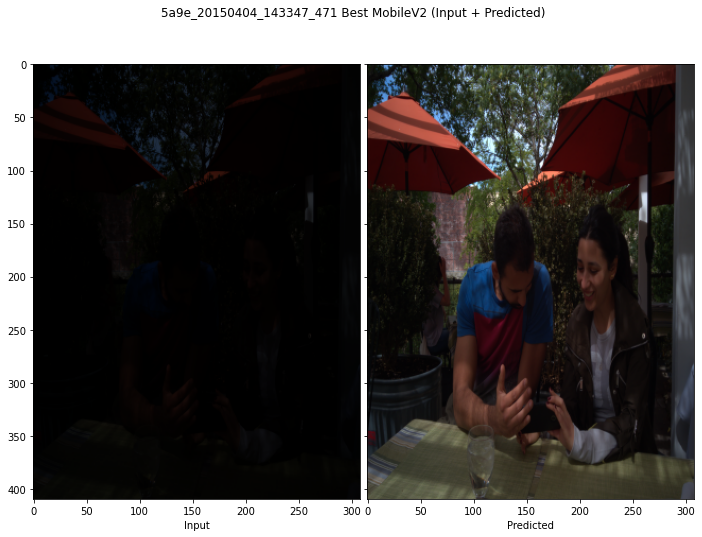

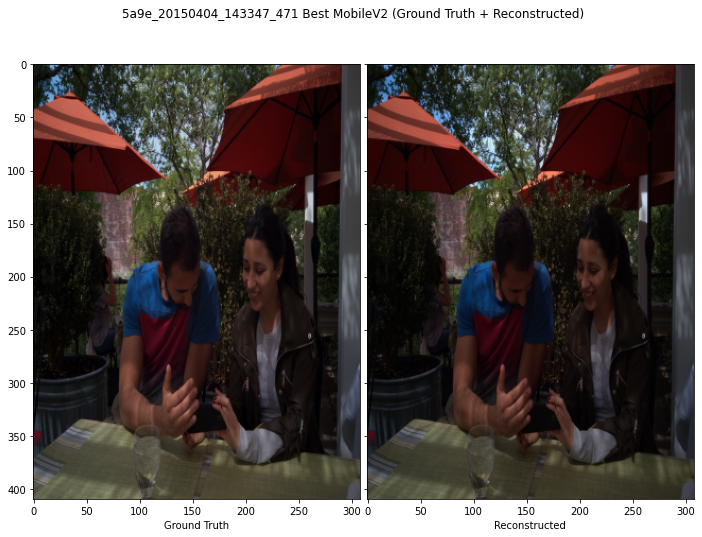

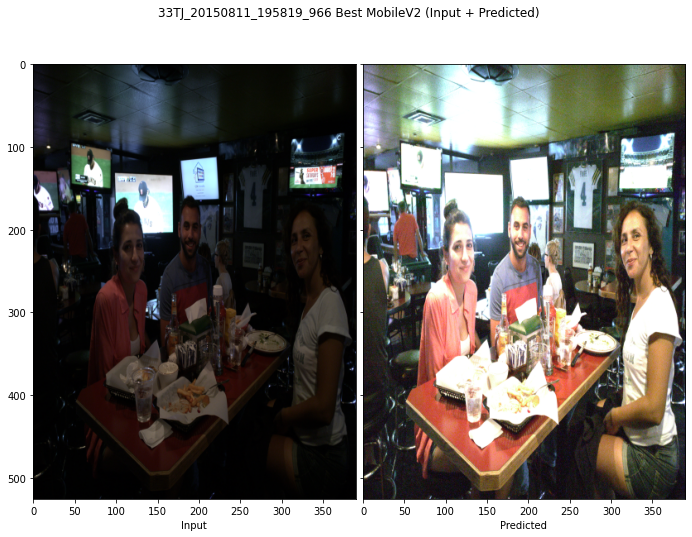

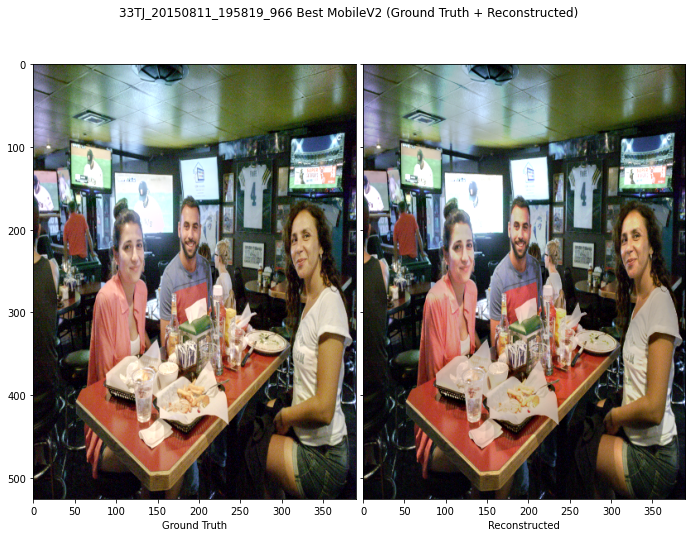

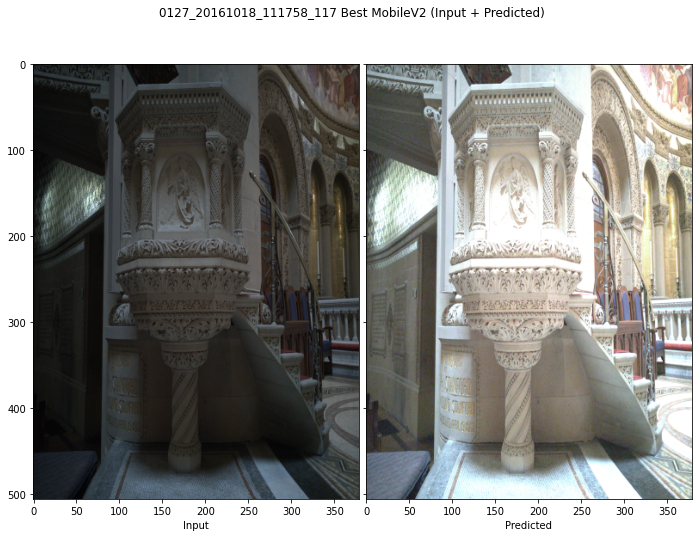

...

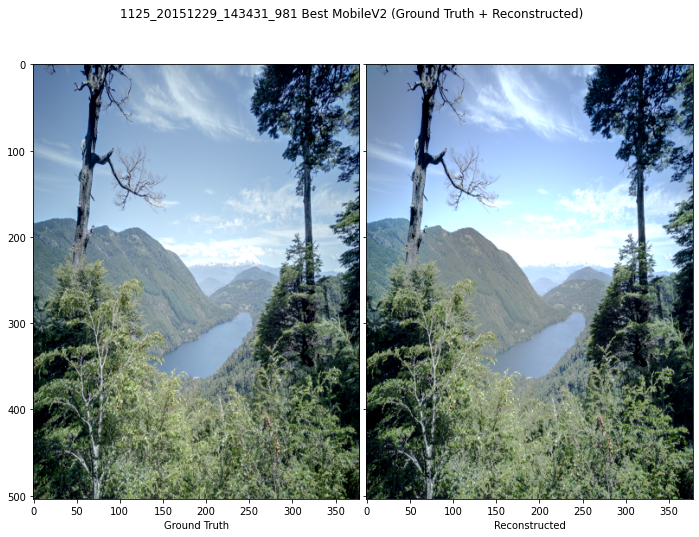

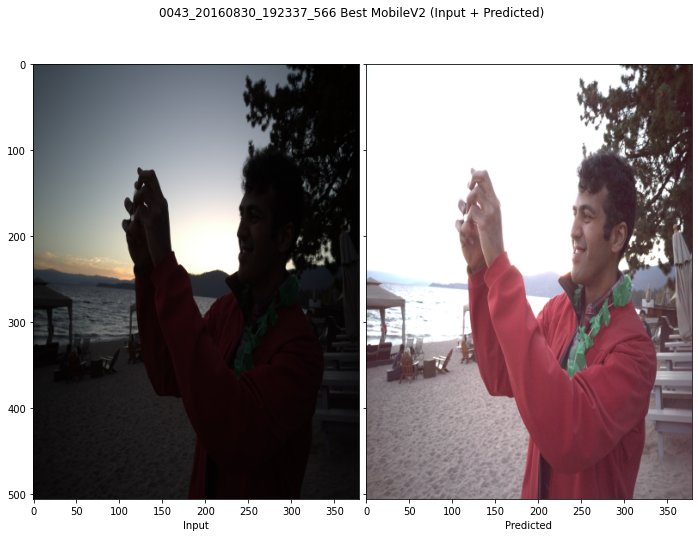

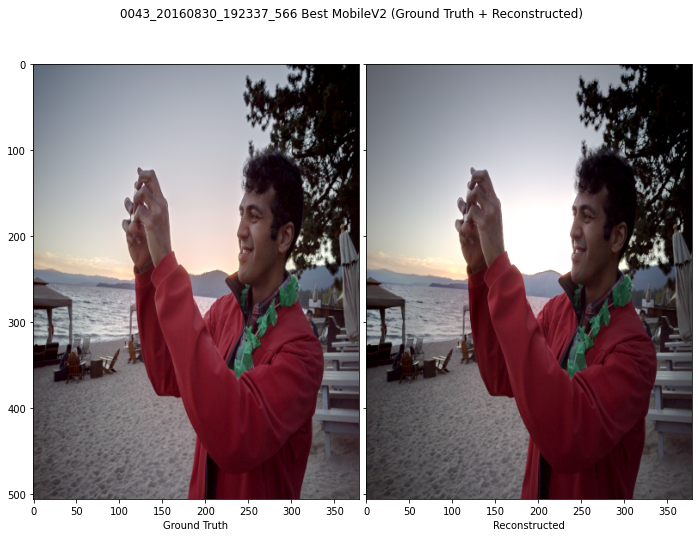

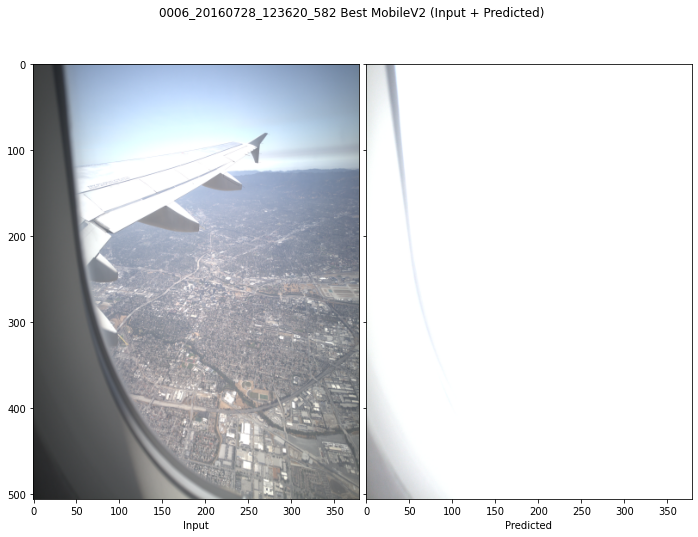

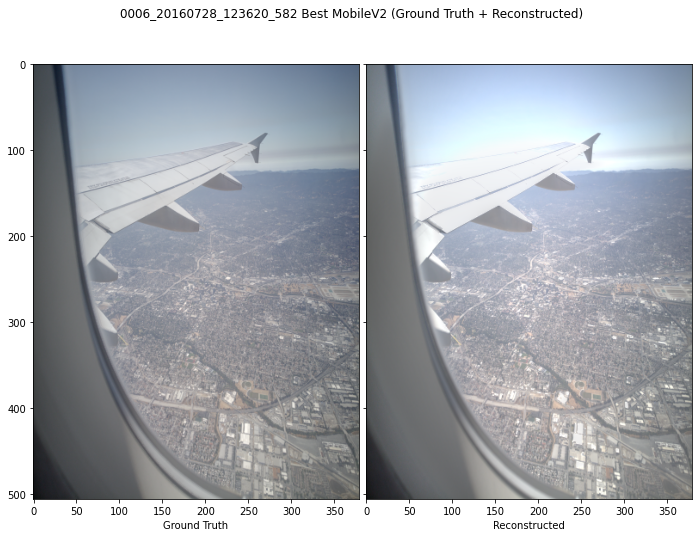

In [33]:
from dhdrnet.vis_util import show_image_pair, show_predictions

show_predictions(predictions, "Best MobileV2", image_names, ev_options)

In [51]:
from more_itertools import chunked, flatten


def load_image(name):
    return Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")

test_names = [
    str(name_arr[0]) 
    for name_arr in pd.read_csv(
        ROOT_DIR / "precomputed_data" / "test_current.csv"
    ).to_numpy()
]

In [70]:
from torchvision.transforms import Compose, Resize, ToTensor

def predictions_by_name(img_name, model):
    name_preds = []
    for chunk in chunked(test_names, n=32):
        images = [load_image(im) for im in chunk]

        transform = Compose(
            [
                Resize((300, 300)),
                ToTensor(),
            ]
        )

        test_batch = torch.stack([transform(im) for im in images])
        predictions = get_preds(model, test_batch).numpy()
        name_preds.append(zip(chunk, predictions, (ev_options[p] for p in predictions)))

    name_preds = list(flatten(name_preds))
    return name_preds


df = pd.DataFrame.from_records(
    predictions_by_name(test_names, best_model),
    columns=["name", "pred_ev_index", "pred_ev"],
).set_index("name")
df

,pred_ev_index,pred_ev
name,,
0030_20151008_105249_589,28,4.00
5066_20160724_121618_110,31,4.75
0037_20160719_125227_729,29,4.25
0543_20150918_175650_498,29,4.25
5a9e_20150404_131348_909,29,4.25
...,...,...
0543_20150918_072911_757,23,2.75
0043_20160908_100556_696,29,4.25
9bf4_20150824_204210_479,29,4.25


In [71]:
from dhdrnet.Dataset import LUTDataset

test_data = LUTDataset(
    df=pd.read_csv(ROOT_DIR / "precomputed_data" / "store_current.csv"),
    exposure_path=DATA_DIR / "correct_exposures" / "exposures",
    raw_dir=DATA_DIR / "dngs",
    name_list=ROOT_DIR / "precomputed_data" / "test_current.csv",
)

In [72]:
test_data.opt_choices

0006_20160721_170707_736    3.25
0006_20160721_175239_909    3.75
0006_20160721_181525_062    4.00
0006_20160722_100126_028    3.50
0006_20160722_100951_201    6.00
                            ... 
c483_20150901_173210_443   -0.75
c483_20150901_194029_165    3.75
c483_20150901_195108_436    3.00
c483_20150901_214630_530    3.00
c483_20150901_221141_886    3.50
Length: 724, dtype: float64

In [86]:
df["opt_ev"] = test_data.opt_choices
ev_df = df[["pred_ev", "opt_ev"]].copy()
ev_df

,pred_ev,opt_ev
name,,
0030_20151008_105249_589,4.00,4.25
5066_20160724_121618_110,4.75,-0.50
0037_20160719_125227_729,4.25,4.50
0543_20150918_175650_498,4.25,4.50
5a9e_20150404_131348_909,4.25,4.50
...,...,...
0543_20150918_072911_757,2.75,2.50
0043_20160908_100556_696,4.25,4.50
9bf4_20150824_204210_479,4.25,4.75


<AxesSubplot:>

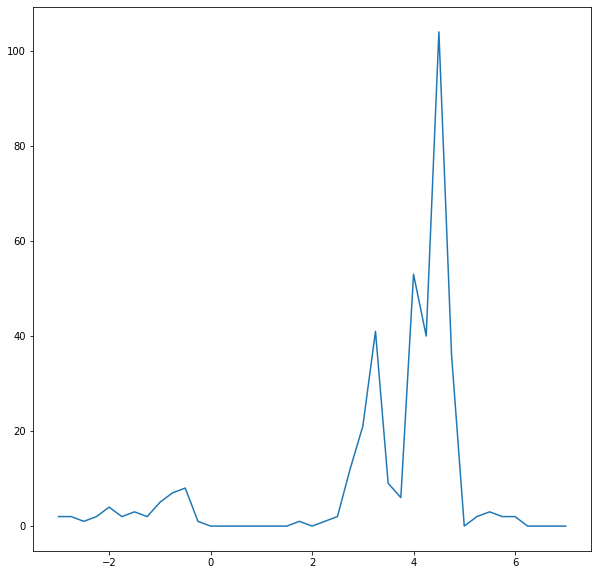

In [199]:
ev_counts = ev_df.apply(lambda s: s.value_counts()).fillna(0).astype(int)
diffs = ((ev_counts["pred_ev"] - ev_counts["opt_ev"])**2).transform(np.sqrt)
diffs.plot()

In [137]:
ev_df["pred_diff"] = abs(ev_df["opt_ev"] - ev_df["pred_ev"])
accuracy = len(ev_df[ev_df["pred_diff"] == 0]) / len(ev_df)
accuracy

0.20165745856353592

In [138]:
ev_df

,pred_ev,opt_ev,pred_diff
name,,,
0030_20151008_105249_589,4.00,4.25,0.25
5066_20160724_121618_110,4.75,-0.50,5.25
0037_20160719_125227_729,4.25,4.50,0.25
0543_20150918_175650_498,4.25,4.50,0.25
5a9e_20150404_131348_909,4.25,4.50,0.25
...,...,...,...
0543_20150918_072911_757,2.75,2.50,0.25
0043_20160908_100556_696,4.25,4.50,0.25
9bf4_20150824_204210_479,4.25,4.75,0.50


In [139]:
len(ev_df[ev_df["pred_diff"] <= 0.50]) / len(ev_df)

0.8466850828729282

<AxesSubplot:title={'center':'% within N EV of Optimal'}, ylabel='EV'>

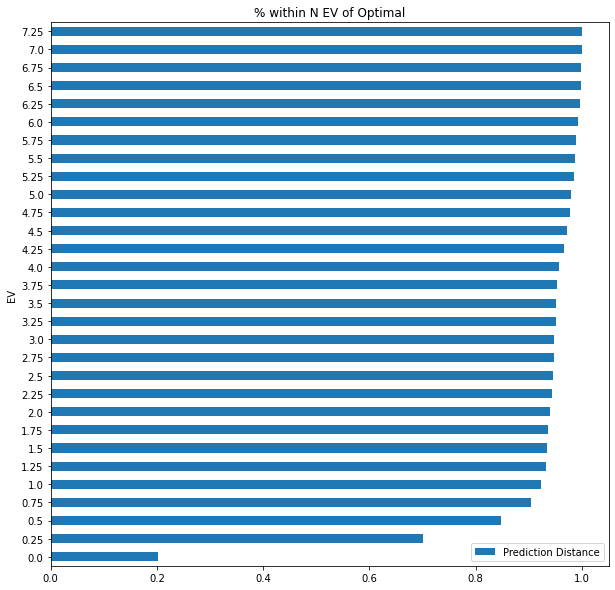

In [193]:
from dhdrnet.util import pred_distance

pred_thresh = pd.DataFrame.from_dict({ 
    thresh: pred_distance(thresh, ev_df, "opt_ev", "pred_ev") 
    for thresh in np.arange(0, 7.5, 0.25) 
}, orient="index",columns=["Prediction Distance"])
pred_thresh.index = pred_thresh.index.rename("EV")
pred_thresh.to_csv(ROOT_DIR/ "figures" / "pct_within.csv")
pred_thresh.sort_index().plot.barh(title="% within N EV of Optimal", legend=True)

In [194]:
pred_thresh

,Prediction Distance
EV,
0.00,0.201657
0.25,0.701657
0.50,0.846685
0.75,0.903315
1.00,0.922652
1.25,0.932320
1.50,0.933702
1.75,0.936464
2.00,0.940608


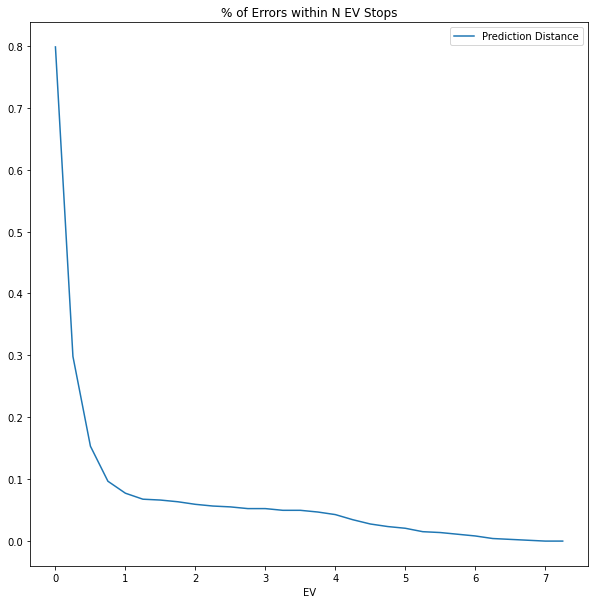

In [195]:
(1 - pred_thresh).plot(title="% of Errors within N EV Stops")
plt.savefig(figdir / "pct_err_within_n_ev_best_model.svg")

In [196]:
tdf = test_data.data
tdf

metric                            mse                                         \
ev                              -3.00        -2.75        -2.50        -2.25   
0006_20160721_170707_736  1564.444742  1620.747432  1666.827206  1694.827552   
0006_20160721_175239_909  4833.678364  4931.049788  5023.474798  5096.684604   
0006_20160721_181525_062  4030.755679  4099.319882  4154.594938  4191.564140   
0006_20160722_100126_028  3096.586446  3195.740610  3285.280822  3355.353795   
0006_20160722_100951_201   256.802163   291.744275   325.948450   357.335873   
...                               ...          ...          ...          ...   
c483_20150901_173210_443   396.788974   414.150080   424.499389   421.893856   
c483_20150901_194029_165  4089.551454  4099.503758  4076.524716  4038.705294   
c483_20150901_195108_436  3136.258062  3158.604146  3150.862320  3122.928498   
c483_20150901_214630_530  5143.751095  5265.341578  5354.983200  5412.049453   
c483_20150901_221141_886  7165.308185  7285.930914  7377.103449  7451.839310   

metric                                                                        \
ev                              -2.00        -1.75        -1.50        -1.25   
0006_20160721_170707_736  1703.434451  1598.156467  1594.859254  1543.512098   
0006_20160721_175239_909  5149.722950  5132.641241  5127.621899  5039.689928   
0006_20160721_181525_062  4196.336224  4112.124243  4107.827877  4003.839777   
0006_20160722_100126_028  3393.217263  3398.260426  3304.577579  3260.788758   
0006_20160722_100951_201   380.441056   381.866729   382.741421   353.604755   
...                               ...          ...          ...          ...   
c483_20150901_173210_443   407.417568   341.777813   338.061688   290.665286   
c483_20150901_194029_165  3962.634683  3856.468872  3444.100464  3442.939489   
c483_20150901_195108_436  3074.531499  2977.176778  2857.079921  2593.799426   
c483_20150901_214630_530  5419.047871  5384.352295  5297.645468  5154.911430   
c483_20150901_221141_886  7482.942462  7485.706860  7433.829155  7331.016986   

metric                                              ...      ssim            \
ev                              -1.00        -0.75  ...      3.75      4.00   
0006_20160721_170707_736  1416.238552  1255.256251  ...  0.959734  0.953911   
0006_20160721_175239_909  4886.487238  4668.281993  ...  0.957424  0.949567   
0006_20160721_181525_062  3848.204339  3646.137740  ...  0.969495  0.965626   
0006_20160722_100126_028  3106.662492  2886.394583  ...  0.963612  0.955471   
0006_20160722_100951_201   303.291687   235.769308  ...  0.975440  0.975728   
...                               ...          ...  ...       ...       ...   
c483_20150901_173210_443   244.182324   212.416530  ...  0.957310  0.956473   
c483_20150901_194029_165  3363.027961  3164.719363  ...  0.971709  0.973337   
c483_20150901_195108_436  2534.649179  2345.410856  ...  0.962358  0.950379   
c483_20150901_214630_530  4959.021309  4355.826203  ...  0.954547  0.946708   
c483_20150901_221141_886  7160.985082  6919.238193  ...  0.939660  0.934590   

metric                                                                      \
ev                            4.25      4.50      4.75      5.00      5.25   
0006_20160721_170707_736  0.947888  0.942444  0.938234  0.935391  0.933572   
0006_20160721_175239_909  0.937777  0.920994  0.899950  0.878370  0.858490   
0006_20160721_181525_062  0.960337  0.953310  0.942647  0.928551  0.910231   
0006_20160722_100126_028  0.945895  0.935127  0.923266  0.910170  0.896825   
0006_20160722_100951_201  0.975196  0.974106  0.972672  0.971321  0.970290   
...                            ...       ...       ...       ...       ...   
c483_20150901_173210_443  0.956189  0.956502  0.957197  0.958147  0.958975   
c483_20150901_194029_165  0.968661  0.959896  0.948609  0.937562  0.926985   
c483_20150901_195108_436  0.938581  0.930643  0.926860  0.926224  0.920695   
c483_20150901_214630_530  0.9367

In [197]:
tdf.xs(("mse"), axis=1)

ev,-3.00,-2.75,-2.50,-2.25,-2.00,-1.75,-1.50,-1.25,-1.00,-0.75,...,3.75,4.00,4.25,4.50,4.75,5.00,5.25,5.50,5.75,6.00
0006_20160721_170707_736,1564.444742,1620.747432,1666.827206,1694.827552,1703.434451,1598.156467,1594.859254,1543.512098,1416.238552,1255.256251,...,204.894840,266.079117,342.824356,417.325202,479.171636,532.625834,578.215898,594.875969,604.528252,629.531647
0006_20160721_175239_909,4833.678364,4931.049788,5023.474798,5096.684604,5149.722950,5132.641241,5127.621899,5039.689928,4886.487238,4668.281993,...,97.861535,113.651506,189.986430,380.395532,683.621096,1032.792516,1373.295946,1692.185380,2001.375581,2310.115054
0006_20160721_181525_062,4030.755679,4099.319882,4154.594938,4191.564140,4196.336224,4112.124243,4107.827877,4003.839777,3848.204339,3646.137740,...,161.401949,151.508049,161.296966,195.781336,260.689689,375.625099,563.947176,832.124956,1191.846109,1607.600744
0006_20160722_100126_028,3096.586446,3195.740610,3285.280822,3355.353795,3393.217263,3398.260426,3304.577579,3260.788758,3106.662492,2886.394583,...,112.903301,191.805441,321.521480,509.792787,743.946110,1008.343893,1273.946062,1511.891965,1682.150097,1785.318792
0006_20160722_100951_201,256.802163,291.744275,325.948450,357.335873,380.441056,381.866729,382.741421,353.604755,303.291687,235.769308,...,127.675286,125.941866,127.301245,130.924251,137.018390,141.826089,140.471864,132.713468,122.435351,115.151326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c483_20150901_173210_443,396.788974,414.150080,424.499389,421.893856,407.417568,341.777813,338.061688,290.665286,244.182324,212.416530,...,491.562211,453.472541,421.067826,395.365695,378.447954,369.290419,363.885802,362.037312,360.937986,359.936870
c483_20150901_194029_165,4089.551454,4099.503758,4076.524716,4038.705294,3962.634683,3856.468872,3444.100464,3442.939489,3363.027961,3164.719363,...,423.285114,436.143826,508.054026,622.056752,736.905143,805.029935,810.227433,749.567060,658.229602,640.969552
c483_20150901_195108_436,3136.258062,3158.604146,3150.862320,3122.928498,3074.531499,2977.176778,2857.079921,2593.799426,2534.649179,2345.410856,...,710.151501,887.286390,958.044685,879.829818,679.485625,496.435131,466.103091,604.858273,860.001265,1174.676678
c483_20150901_214630_530,5143.751095,5265.341578,5354.983200,5412.049453,5419.047871,5384.352295,5297.645468,5154.911430,4959.021309,4355.826203,...,223.605843,387.514681,640.342330,992.222301,1392.208206,1807.255907,2194.806341,2532.385886,2805.825094,3006.353365


In [228]:
udf = pd.read_csv(ROOT_DIR / "precomputed_data" / "store_updown_wider-2020-07-26.csv")

udf = (
        udf[udf["metric"] == "mse"]
            .set_index("name")
            .drop(columns=["metric"])
            .rename(columns={"score": "mse"})
      )
udf[udf["ev"] == 1]

,ev,mse
name,,
0030_20151008_105249_589,1,2343.424619
5066_20160724_121618_110,1,224.912385
0037_20160719_125227_729,1,6796.418277
0543_20150918_175650_498,1,5585.118966
5a9e_20150404_131348_909,1,4945.540302
...,...,...
0543_20150918_072911_757,1,1295.902438
0043_20160908_100556_696,1,8423.394765
9bf4_20150824_204210_479,1,7877.509861


# next
take the corresponding evs for the predictions, and compare the errors from both for a measure of how much better they are.

Do the same for all ev == 1, all ev == -1, all ev == 4.5 (as it is most likely correct choice by histogram)
And then compare it to randomly selecting an EV.

<AxesSubplot:xlabel='opt_ev', ylabel='pred_ev'>

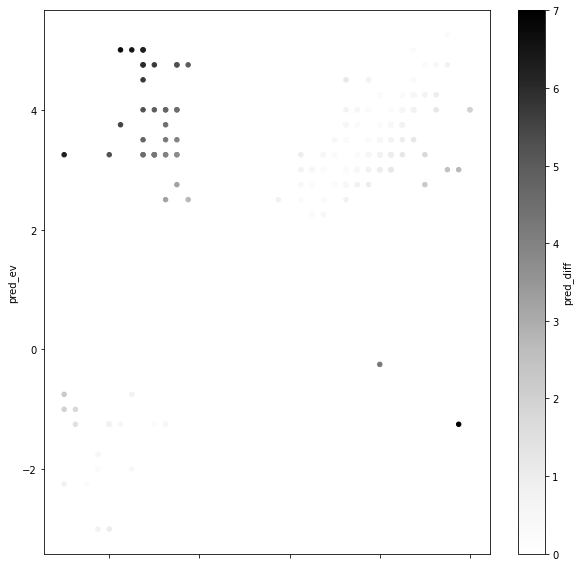

In [229]:
ev_df.plot.scatter(x="opt_ev", y="pred_ev", c="pred_diff")

In [230]:
from collections import defaultdict

opt_mse = defaultdict(dict)
for name in test_data.names:
    ev = ev_df.loc[name, "pred_ev"]
    for metric in ["mse", "perceptual", "ssim"]:
        opt_mse[metric][name] = tdf.loc[name, ("mse", ev)]
        opt_mse["ev"][name] = ev

opt_df = pd.DataFrame.from_dict(opt_mse)
opt_df["updown_mse"] = udf[udf["ev"] == 1]["mse"]
opt_df

,mse,ev,perceptual,ssim,updown_mse
0006_20160721_170707_736,191.736304,3.00,191.736304,191.736304,260.769416
0006_20160721_175239_909,97.861535,3.75,97.861535,97.861535,2490.291122
0006_20160721_181525_062,161.401949,3.75,161.401949,161.401949,2132.154446
0006_20160722_100126_028,94.179421,3.25,94.179421,94.179421,1147.533237
0006_20160722_100951_201,125.941866,4.00,125.941866,125.941866,176.220993
...,...,...,...,...,...
c483_20150901_173210_443,453.472541,4.00,453.472541,453.472541,296.053507
c483_20150901_194029_165,423.285114,3.75,423.285114,423.285114,2443.551787
c483_20150901_195108_436,462.968606,2.75,462.968606,462.968606,1784.593285
c483_20150901_214630_530,106.061086,2.75,106.061086,106.061086,2149.166483


In [56]:
opt_df[["mse", "updown_mse"]].pct_change(axis="columns").mean()

mse                 NaN
updown_mse    40.683993
dtype: float64

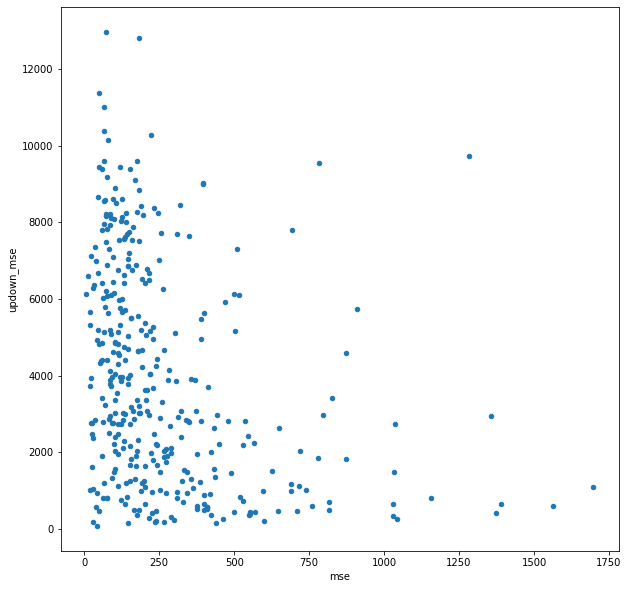

In [57]:
opt_df.plot.scatter(x="mse", y="updown_mse")

In [58]:
t_mse = tdf["mse"]
opt_df["ev-1_mse"] = t_mse[-1]
opt_df["ev+1_mse"] = t_mse[1]
opt_df

,mse,ev,perceptual,ssim,updown_mse,ev-1_mse,ev+1_mse
0006_20160721_175239_909,113.651506,4.00,113.651506,113.651506,2490.29,4886.487238,1730.344056
0006_20160721_175246_335,151.979123,4.25,151.979123,151.979123,1665.12,3590.801292,1073.145826
0006_20160723_152642_719,374.978815,3.25,374.978815,374.978815,531.994,1650.623988,502.369369
0006_20160723_203440_560,47.789956,4.25,47.789956,47.789956,11387.5,14392.016191,10704.661471
0006_20160726_185528_801,190.632691,3.75,190.632691,190.632691,5203.21,6872.098847,4421.665622
...,...,...,...,...,...,...,...
c483_20150901_211301_691,264.528658,2.75,264.528658,264.528658,2027.76,3963.301076,1387.853857
c483_20150901_211303_855,289.270774,2.75,289.270774,289.270774,1993.02,4064.936919,1312.434624
synthetic_boxes_day_motion_blur,450.049935,3.25,450.049935,450.049935,2206.65,3378.679217,1663.598323
synthetic_ramp_day,408.363118,-1.00,408.363118,408.363118,562.965,408.363118,1718.970042


In [59]:
opt_df[["mse", "ev+1_mse"]].pct_change(axis="columns").mean()

mse               NaN
ev+1_mse    37.185674
dtype: float64

In [60]:
opt_df[["mse", "ev-1_mse"]].pct_change(axis="columns").mean()

mse               NaN
ev-1_mse    55.734203
dtype: float64

In [61]:
opt_df.mean()

mse            262.326931
ev               3.429945
perceptual     262.326931
ssim           262.326931
updown_mse    3988.548436
ev-1_mse      5867.693837
ev+1_mse      3558.302840
dtype: float64